In [9]:
!rm -rf data

In [10]:
# data.py
import os
import cv2
import glob
import numpy as np
import torch
import torch.utils.data as data
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from zipfile import ZipFile

# The dataset class
class CrackerBox(data.Dataset):
    def __init__(self, image_set='train', zip_file=None, data_path='data'):
        self.name = 'cracker_box_' + image_set
        self.image_set = image_set
        if zip_file is not None:
            with ZipFile(zip_file, 'r') as zObject:
                zObject.extractall(path="")
        self.data_path = data_path
        self.classes = ('__background__', 'cracker_box')
        self.width = 640
        self.height = 480
        self.yolo_image_size = 448
        self.scale_width = self.yolo_image_size / self.width
        self.scale_height = self.yolo_image_size / self.height
        self.yolo_grid_num = 7
        self.yolo_grid_size = self.yolo_image_size / self.yolo_grid_num
        # split images into training set and validation set
        self.gt_files_train, self.gt_files_val = self.list_dataset()
        # the pixel mean for normalization
        self.pixel_mean = np.array([[[102.9801, 115.9465, 122.7717]]], dtype=np.float32)

        # training set
        if image_set == 'train':
            self.size = len(self.gt_files_train)
            self.gt_paths = self.gt_files_train
            print('%d images for training' % self.size)
        else:
            # validation set
            self.size = len(self.gt_files_val)
            self.gt_paths = self.gt_files_val
            print('%d images for validation' % self.size)

    # list the ground truth annotation files
    # use the first 100 images for training
    def list_dataset(self):

        filename = os.path.join(self.data_path, '*.txt')
        gt_files = sorted(glob.glob(filename))

        gt_files_train = gt_files[:100]
        gt_files_val = gt_files[100:]

        return gt_files_train, gt_files_val

    def __getitem__(self, idx):

        # gt file
        filename_gt = self.gt_paths[idx]

        # Computing image_blob
        img_filename = filename_gt[:-len('-box.txt')] + '.jpg'
        img = cv2.imread(filename=img_filename)
        dim = (self.yolo_image_size, self.yolo_image_size)
        img = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)
        image_blob = (img - self.pixel_mean) / 255.0
        image_blob = torch.tensor(image_blob.transpose((2, 0, 1)))

        # Computing gt_box_blob
        dim = (5, self.yolo_grid_num, self.yolo_grid_num)
        gt_box_blob = torch.zeros(dim)

        # Get the ground truth values from the file
        string_ = open(filename_gt, 'r').read()
        x1, y1, x2, y2 = np.fromstring(string_, dtype=float, sep=' ')
        x1_scaled = x1 * self.scale_width
        x2_scaled = x2 * self.scale_width
        y1_scaled = y1 * self.scale_height
        y2_scaled = y2 * self.scale_height
        w = x2_scaled - x1_scaled
        h = y2_scaled - y1_scaled
        cx = (x1_scaled+x2_scaled) / 2
        cy = (y1_scaled+y2_scaled) / 2
        c = np.array((cy, cx))
        cell = (c//self.yolo_grid_size).astype(int)
        offset = torch.tensor(c - cell*self.yolo_grid_size)
        normalized_offset = offset / self.yolo_grid_size

        gt_box_blob[0, cell[0], cell[1]] = normalized_offset[1]
        gt_box_blob[1, cell[0], cell[1]] = normalized_offset[0]
        gt_box_blob[2, cell[0], cell[1]] = w / self.yolo_image_size
        gt_box_blob[3, cell[0], cell[1]] = h / self.yolo_image_size
        gt_box_blob[4, cell[0], cell[1]] = 1

        dim = (self.yolo_grid_num, self.yolo_grid_num)
        gt_mask_blob = torch.zeros(dim)
        gt_mask_blob[cell[0], cell[1]] = 1

        # this is the sample dictionary to be returned from this function
        sample = {'image': image_blob,
                  'gt_box': gt_box_blob,
                  'gt_mask': gt_mask_blob}

        return sample

    # len of the dataset
    def __len__(self):
        return self.size



In [11]:
# model.py
import math
import torch
import torch.nn as nn
from collections import OrderedDict

# the YOLO network class
class YOLO(nn.Module):
    def __init__(self, num_boxes, num_classes, device='cpu'):
        super(YOLO, self).__init__()
        self.device = device
        # number of bounding boxes per cell (2 in our case)
        self.num_boxes = num_boxes
        # number of classes for detection (1 in our case: cracker box)
        self.num_classes = num_classes
        self.image_size = 448
        self.grid_size = 64
        # create the network
        self.network = self.create_modules()
        self.network.to(self.device)

        # initialize weights
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def create_modules(self):
        modules = nn.Sequential()

        # Convolutional Stack 1
        Conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
        ReLU1 = nn.ReLU()
        MaxPool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        conv_stack1 = nn.Sequential(OrderedDict([
            ('Conv1', Conv1),
            ('ReLU1', ReLU1),
            ('MaxPool1', MaxPool1)
        ]))

        # Convolutional Stack 2
        Conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1)
        ReLU2 = nn.ReLU()
        MaxPool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        conv_stack2 = nn.Sequential(OrderedDict([
            ('Conv2', Conv2),
            ('ReLU2', ReLU2),
            ('MaxPool2', MaxPool2)
        ]))

        # Convolutional Stack 3
        Conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        ReLU3 = nn.ReLU()
        MaxPool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        conv_stack3 = nn.Sequential(OrderedDict([
            ('Conv3', Conv3),
            ('ReLU3', ReLU3),
            ('MaxPool3', MaxPool3)
        ]))

        # Convolutional Stack 4
        Conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        ReLU4 = nn.ReLU()
        MaxPool4 = nn.MaxPool2d(kernel_size=2, stride=2)
        conv_stack4 = nn.Sequential(OrderedDict([
            ('Conv4', Conv4),
            ('ReLU4', ReLU4),
            ('MaxPool4', MaxPool4)
        ]))

        # Convolutional Stack 5
        Conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
        ReLU5 = nn.ReLU()
        MaxPool5 = nn.MaxPool2d(kernel_size=2, stride=2)
        conv_stack5 = nn.Sequential(OrderedDict([
            ('Conv5', Conv5),
            ('ReLU5', ReLU5),
            ('MaxPool5', MaxPool5)
        ]))

        # Convolutional Stack 6
        Conv6 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1)
        ReLU6 = nn.ReLU()
        MaxPool6 = nn.MaxPool2d(kernel_size=2, stride=2)
        conv_stack6 = nn.Sequential(OrderedDict([
            ('Conv6', Conv6),
            ('ReLU6', ReLU6),
            ('MaxPool6', MaxPool6)
        ]))

        # Convolutional Stack 7
        Conv7 = nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=3, stride=1, padding=1)
        ReLU7 = nn.ReLU()
        conv_stack7 = nn.Sequential(OrderedDict([
            ('Conv7', Conv7),
            ('ReLU7', ReLU7),
        ]))

        # Convolutional Stack 8
        Conv8 = nn.Conv2d(in_channels=1024, out_channels=1024, kernel_size=3, stride=1, padding=1)
        ReLU8 = nn.ReLU()
        conv_stack8 = nn.Sequential(OrderedDict([
            ('Conv8', Conv8),
            ('ReLU8', ReLU8),
        ]))

        # Convolutional Stack 9
        Conv9 = nn.Conv2d(in_channels=1024, out_channels=1024, kernel_size=3, stride=1, padding=1)
        ReLU9 = nn.ReLU()
        conv_stack9 = nn.Sequential(OrderedDict([
            ('Conv9', Conv9),
            ('ReLU9', ReLU9),
        ]))

        # Fully Connected Stack
        flatten = nn.Flatten()
        FC1 = nn.Linear(in_features=50176, out_features=256)
        FC2 = nn.Linear(in_features=256, out_features=256)
        output = nn.Linear(in_features=256, out_features=49*(5*self.num_boxes+self.num_classes))
        sigmoid = nn.Sigmoid()
        fc_stack = nn.Sequential(OrderedDict([
            ('Flatten', flatten),
            ('FC1', FC1),
            ('FC2', FC2),
            ('Output', output),
            ('Sigmoid', sigmoid)
        ]))

        modules.add_module('Conv Stack 1', conv_stack1)
        modules.add_module('Conv Stack 2', conv_stack2)
        modules.add_module('Conv Stack 3', conv_stack3)
        modules.add_module('Conv Stack 4', conv_stack4)
        modules.add_module('Conv Stack 5', conv_stack5)
        modules.add_module('Conv Stack 6', conv_stack6)
        modules.add_module('Conv Stack 7', conv_stack7)
        modules.add_module('Conv Stack 8', conv_stack8)
        modules.add_module('Conv Stack 9', conv_stack9)
        modules.add_module('FC Stack', fc_stack)
        return modules

    # output (batch_size, 5*B + C, 7, 7)
    # In the network output (cx, cy, w, h) are normalized to be [0, 1]
    # This function undo the noramlization to obtain the bounding boxes in the original image space
    def transform_predictions(self, output):
        batch_size = output.shape[0]
        x = torch.linspace(0, 384, steps=7)
        y = torch.linspace(0, 384, steps=7)
        corner_x, corner_y = torch.meshgrid(x, y, indexing='xy')
        corner_x = torch.unsqueeze(corner_x, dim=0)
        corner_y = torch.unsqueeze(corner_y, dim=0)
        corners = torch.cat((corner_x, corner_y), dim=0)
        # corners are top-left corners for each cell in the grid
        corners = corners.unsqueeze(0).repeat(batch_size, 1, 1, 1).to(self.device)
        pred_box = output.clone()

        # for each bounding box
        for i in range(self.num_boxes):
            # x and y
            pred_box[:, i*5, :, :] = corners[:, 0, :, :] + output[:, i*5, :, :] * self.grid_size
            pred_box[:, i*5+1, :, :] = corners[:, 1, :, :] + output[:, i*5+1, :, :] * self.grid_size
            # w and h
            pred_box[:, i*5+2, :, :] = output[:, i*5+2, :, :] * self.image_size
            pred_box[:, i*5+3, :, :] = output[:, i*5+3, :, :] * self.image_size

        return pred_box

    # forward pass of the YOLO network
    def forward(self, x):
        # raw output from the network
        output = self.network(x).reshape((-1, self.num_boxes * 5 + self.num_classes, 7, 7))
        # compute bounding boxes in the original image space
        pred_box = self.transform_predictions(output)
        return output, pred_box

In [12]:
# loss.py
import torch


# compute Intersection over Union (IoU) of two bounding boxes
# the input bounding boxes are in (cx, cy, w, h) format
def compute_iou(pred, gt):
    x1p = pred[0] - pred[2] * 0.5
    x2p = pred[0] + pred[2] * 0.5
    y1p = pred[1] - pred[3] * 0.5
    y2p = pred[1] + pred[3] * 0.5
    areap = (x2p - x1p + 1) * (y2p - y1p + 1)

    x1g = gt[0] - gt[2] * 0.5
    x2g = gt[0] + gt[2] * 0.5
    y1g = gt[1] - gt[3] * 0.5
    y2g = gt[1] + gt[3] * 0.5
    areag = (x2g - x1g + 1) * (y2g - y1g + 1)

    xx1 = max(x1p, x1g)
    yy1 = max(y1p, y1g)
    xx2 = min(x2p, x2g)
    yy2 = min(y2p, y2g)

    w = max(0.0, xx2 - xx1 + 1)
    h = max(0.0, yy2 - yy1 + 1)
    inter = w * h
    iou = inter / (areap + areag - inter)
    return iou


# output: (batch_size, num_boxes * 5 + num_classes, 7, 7), raw output from the network
# pred_box: (batch_size, num_boxes * 5 + num_classes, 7, 7), predicted bounding boxes from the network (see the forward() function)
# gt_box: (batch_size, 5, 7, 7), ground truth bounding box target from the dataloader
# gt_mask: (batch_size, 7, 7), ground truth bounding box mask from the dataloader
# num_boxes: number of bounding boxes per cell
# num_classes: number of object classes for detection
# grid_size: YOLO grid size, 64 in our case
# image_size: YOLO image size, 448 in our case
def compute_loss(output, pred_box, gt_box, gt_mask, num_boxes, num_classes, grid_size, image_size, device):
    batch_size = output.shape[0]
    num_grids = output.shape[2]
    # compute mask with shape (batch_size, num_boxes, 7, 7) for box assignment
    box_mask = torch.zeros(batch_size, num_boxes, num_grids, num_grids)
    box_confidence = torch.zeros(batch_size, num_boxes, num_grids, num_grids)

    # compute assignment of predicted bounding boxes for ground truth bounding boxes
    for i in range(batch_size):
        for j in range(num_grids):
            for k in range(num_grids):

                # if the gt mask is 1
                if gt_mask[i, j, k] > 0:
                    # transform gt box
                    gt = gt_box[i, :, j, k].clone()
                    gt[0] = gt[0] * grid_size + k * grid_size
                    gt[1] = gt[1] * grid_size + j * grid_size
                    gt[2] = gt[2] * image_size
                    gt[3] = gt[3] * image_size
                    # This is basically un-normalized ground truth
                    # print('gt in loss %.2f, %.2f, %.2f, %.2f' % (gt[0], gt[1], gt[2], gt[3]))

                    select = 0
                    max_iou = -1
                    # select the one with maximum IoU
                    for b in range(num_boxes):
                        # center x, y and width, height
                        pred = pred_box[i, 5*b:5*b+4, j, k].clone()
                        iou = compute_iou(gt, pred)
                        if iou > max_iou:
                            max_iou = iou
                            select = b
                    box_mask[i, select, j, k] = 1
                    box_confidence[i, select, j, k] = max_iou
    box_confidence = box_confidence.to(device)
    box_mask = box_mask.to(device)
    # compute yolo loss
    weight_coord = 5.0
    weight_noobj = 0.5

    # according to the YOLO paper, we compute the following losses
    # loss_x: loss function on x coordinate (cx)
    # loss_y: loss function on y coordinate (cy)
    # loss_w: loss function on width
    # loss_h: loss function on height
    # loss_obj: loss function on confidence for objects
    # loss_noobj: loss function on confidence for non-objects
    # loss_cls: loss function for object class


    def sq_error(gt_, pred_):
        return torch.pow(gt_ - pred_, 2.0)

    loss_x = weight_coord * torch.sum(box_mask * sq_error(gt_box[:, 0, :, :].unsqueeze(dim=1), output[:, 0:5*num_boxes:5, :, :]))
    loss_y = weight_coord * torch.sum(box_mask * sq_error(gt_box[:, 1, :, :].unsqueeze(dim=1), output[:, 1:5*num_boxes:5, :, :]))
    loss_w = weight_coord * torch.sum(box_mask * sq_error(torch.sqrt(gt_box[:, 2, :, :].unsqueeze(dim=1)), torch.sqrt(output[:, 2:5*num_boxes:5, :, :])))
    loss_h = weight_coord * torch.sum(box_mask * sq_error(torch.sqrt(gt_box[:, 3, :, :].unsqueeze(dim=1)), torch.sqrt(output[:, 3:5*num_boxes:5, :, :])))
    loss_obj = torch.sum(box_mask * sq_error(box_confidence, output[:, 4:5*num_boxes:5, :, :]))
    loss_noobj = weight_noobj * torch.sum((1-box_mask) * sq_error(box_confidence, output[:, 4:5*num_boxes:5, :, :]))
    loss_cls = torch.sum(box_mask * sq_error(gt_mask.unsqueeze(dim=1), output[:, 5*num_boxes:, :, :]))

    # the total loss
    loss = loss_x + loss_y + loss_w + loss_h + loss_obj + loss_noobj + loss_cls
    return loss

# plot losses
def plot_losses(losses, filename='train_loss.png'):

    num_epoches = losses.shape[0]
    l = np.mean(losses, axis=1)

    plt.subplot(1, 1, 1)
    plt.plot(range(num_epoches), l, marker='o', alpha=0.5, ms=4)
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.xlim()

    plt.gcf().set_size_inches(6, 4)
    plt.savefig(filename, bbox_inches='tight')
    print('save training loss plot to %s' % (filename))
    plt.clf()

In [13]:
#train.py
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from packaging.version import Version



if __name__ == '__main__':

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    num_epochs = 100
    batch_size = 8
    learning_rate = 1e-4
    num_workers = 2

    dataset_train = CrackerBox('train', 'data.zip')
    train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    epoch_size = len(train_loader)

    num_classes = 1
    num_boxes = 2
    network = YOLO(num_boxes, num_classes, device=device)
    print(network.device)
    image_size = network.image_size
    grid_size = network.grid_size
    network.train()

    optimizer = torch.optim.Adam(network.parameters(), lr=learning_rate)

    output_dir = 'checkpoints'
    print('Output will be saved to `{:s}`'.format(output_dir))
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    losses = np.zeros((num_epochs, epoch_size), dtype=np.float32)
    for epoch in range(num_epochs):
        for i, sample in enumerate(train_loader):
            image = sample['image'].to(device)
            gt_box = sample['gt_box'].to(device)
            gt_mask = sample['gt_mask'].to(device)

            output, pred_box = network(image)

            loss = compute_loss(output, pred_box, gt_box, gt_mask, num_boxes, num_classes, grid_size, image_size, network.device)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            losses[epoch, i] = loss

        epoch_loss = losses[epoch, :].sum() / epoch_size
        print('epoch %d/%d, lr %.6f, average epoch loss %.4f' % (epoch, num_epochs, learning_rate, epoch_loss))
        # save checkpoint for every fifth epoch
        if epoch % 5 == 0:
            state = network.state_dict()
            filename = 'yolo_epoch_{:d}'.format(epoch+1) + '.checkpoint.pth'
            torch.save(state, os.path.join(output_dir, filename))
            print(filename)
    state = network.state_dict()
    filename = 'yolo_final.checkpoint.pth'
    torch.save(state, os.path.join(output_dir, filename))
    print(filename)


    plot_losses(losses)


100 images for training
cuda
Output will be saved to `checkpoints`
epoch 0/100, lr 0.000100, average epoch loss 56.5209
yolo_epoch_1.checkpoint.pth
epoch 1/100, lr 0.000100, average epoch loss 41.4159
epoch 2/100, lr 0.000100, average epoch loss 28.7850
epoch 3/100, lr 0.000100, average epoch loss 17.5882
epoch 4/100, lr 0.000100, average epoch loss 13.5403
epoch 5/100, lr 0.000100, average epoch loss 12.1196
yolo_epoch_6.checkpoint.pth
epoch 6/100, lr 0.000100, average epoch loss 10.4049
epoch 7/100, lr 0.000100, average epoch loss 9.4777
epoch 8/100, lr 0.000100, average epoch loss 8.7336
epoch 9/100, lr 0.000100, average epoch loss 8.8000
epoch 10/100, lr 0.000100, average epoch loss 8.2637
yolo_epoch_11.checkpoint.pth
epoch 11/100, lr 0.000100, average epoch loss 8.1496
epoch 12/100, lr 0.000100, average epoch loss 8.1327
epoch 13/100, lr 0.000100, average epoch loss 7.8619
epoch 14/100, lr 0.000100, average epoch loss 7.9969
epoch 15/100, lr 0.000100, average epoch loss 8.0303
yol

<Figure size 600x400 with 0 Axes>

In [14]:

# compute average precision for object detection
def voc_ap(rec, prec, use_07_metric=False):
    """ ap = voc_ap(rec, prec, [use_07_metric])
    Compute VOC AP given precision and recall.
    If use_07_metric is true, uses the
    VOC 07 11 point method (default:False).
    """
    if use_07_metric:
        # 11 point metric
        ap = 0.
        for t in np.arange(0., 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.
    else:
        # correct AP calculation
        # first append sentinel values at the end
        mrec = np.concatenate(([0.], rec, [1.]))
        mpre = np.concatenate(([0.], prec, [0.]))

        # compute the precision envelope
        for i in range(mpre.size - 1, 0, -1):
            mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

        # to calculate area under PR curve, look for points
        # where X axis (recall) changes value
        i = np.where(mrec[1:] != mrec[:-1])[0]

        # and sum (\Delta recall) * prec
        ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap

def voc_eval(results_gt, results_pred,
             ovthresh=0.5,
             use_07_metric=False):
    """rec, prec, ap = voc_eval(detpath,
                                annopath,
                                imagesetfile,
                                classname,
                                [ovthresh],
                                [use_07_metric])

    Top level function that does the PASCAL VOC evaluation.

    detpath: Path to detections
        detpath.format(classname) should produce the detection results file.
    annopath: Path to annotations
        annopath.format(imagename) should be the xml annotations file.
    imagesetfile: Text file containing the list of images, one image per line.
    classname: Category name (duh)
    cachedir: Directory for caching the annotations
    [ovthresh]: Overlap threshold (default = 0.5)
    [use_07_metric]: Whether to use VOC07's 11 point AP computation
        (default False)
    """

    # process gt
    gt_recs = []
    npos = 0
    num_images = len(results_gt)
    for i in range(num_images):
        bbox = results_gt[i]
        det = [False] * bbox.shape[0]
        rec = {'bbox': bbox, 'det': det}
        gt_recs.append(rec)
        npos += bbox.shape[0]

    # read dets
    boxes_all = np.zeros((0, 6), dtype=np.float32)
    for i in range(num_images):
        detection = results_pred[i]
        n = detection.shape[0]
        boxes = np.zeros((n, 6), dtype=np.float32)
        boxes[:, 0] = i
        boxes[:, 1:] = detection
        boxes_all = np.concatenate((boxes_all, boxes), axis=0)

    image_ids = boxes_all[:, 0]
    confidence = boxes_all[:, 5]
    BB = boxes_all[:, 1:5]

    # sort by confidence
    sorted_ind = np.argsort(-confidence)
    sorted_scores = np.sort(-confidence)
    BB = BB[sorted_ind, :]
    image_ids = image_ids[sorted_ind]

    # go down dets and mark TPs and FPs
    nd = len(image_ids)
    tp = np.zeros(nd)
    fp = np.zeros(nd)
    for d in range(nd):
        R = gt_recs[int(image_ids[d])]
        bb = BB[d, :].astype(float)
        ovmax = -np.inf
        BBGT = R['bbox'].astype(float)

        if BBGT.size > 0:
            # compute overlaps
            # intersection
            ixmin = np.maximum(BBGT[:, 0], bb[0])
            iymin = np.maximum(BBGT[:, 1], bb[1])
            ixmax = np.minimum(BBGT[:, 2], bb[2])
            iymax = np.minimum(BBGT[:, 3], bb[3])
            iw = np.maximum(ixmax - ixmin + 1., 0.)
            ih = np.maximum(iymax - iymin + 1., 0.)
            inters = iw * ih

            # union
            uni = ((bb[2] - bb[0] + 1.) * (bb[3] - bb[1] + 1.) +
                   (BBGT[:, 2] - BBGT[:, 0] + 1.) *
                   (BBGT[:, 3] - BBGT[:, 1] + 1.) - inters)

            overlaps = inters / uni
            ovmax = np.max(overlaps)
            jmax = np.argmax(overlaps)

        if ovmax > ovthresh:
            if not R['det'][jmax]:
                tp[d] = 1.
                R['det'][jmax] = 1
            else:
                fp[d] = 1.
        else:
            fp[d] = 1.

    # compute precision recall
    fp = np.cumsum(fp)
    tp = np.cumsum(tp)
    rec = tp / float(npos)
    # avoid divide by zero in case the first detection matches a difficult
    # ground truth
    prec = tp / np.maximum(tp + fp, np.finfo(np.float64).eps)
    ap = voc_ap(rec, prec, use_07_metric)

    return rec, prec, ap


100 images for validation
image 1/100, 1 objects detected


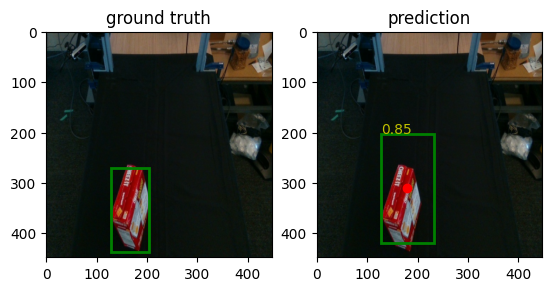

image 2/100, 0 objects detected


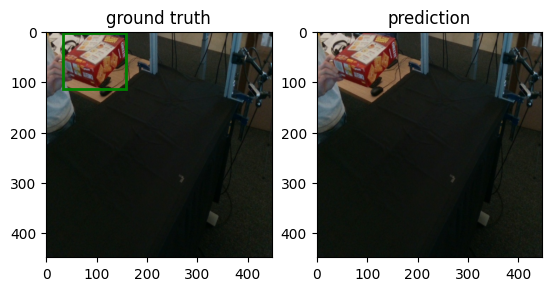

image 3/100, 1 objects detected


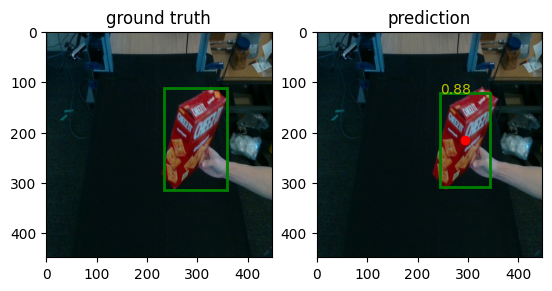

image 4/100, 3 objects detected


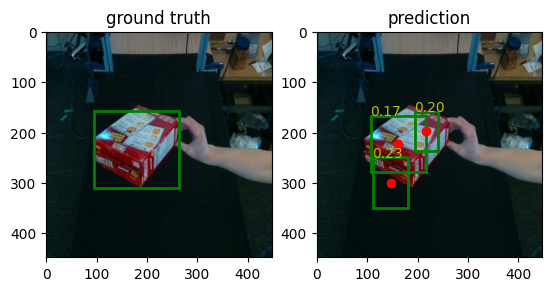

image 5/100, 2 objects detected


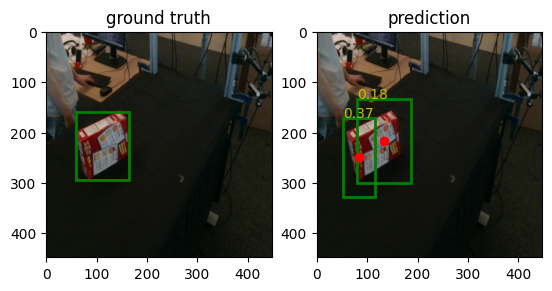

image 6/100, 1 objects detected


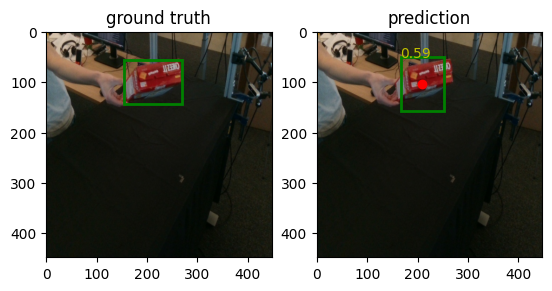

image 7/100, 1 objects detected


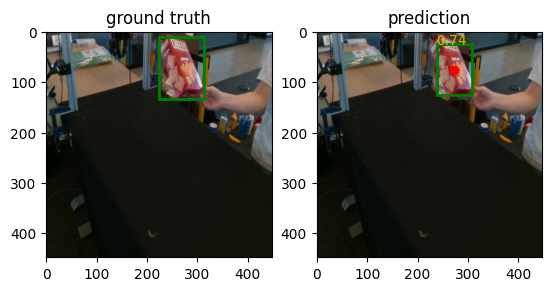

image 8/100, 1 objects detected


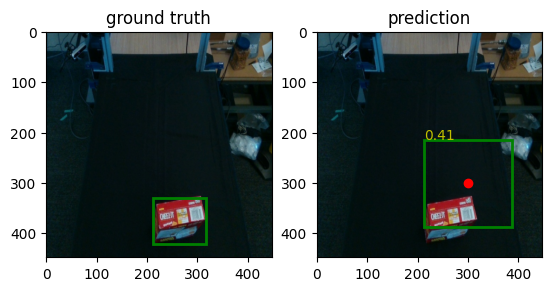

image 9/100, 0 objects detected


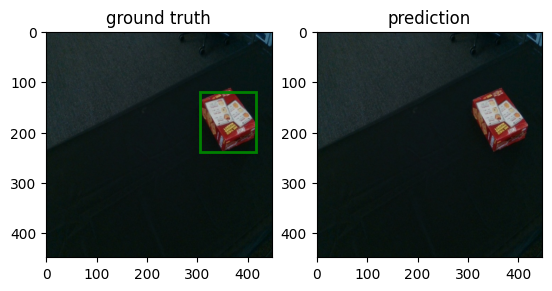

image 10/100, 1 objects detected


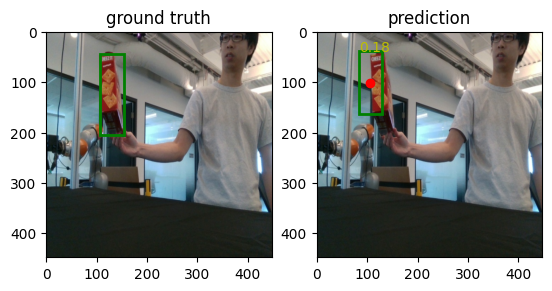

image 11/100, 2 objects detected


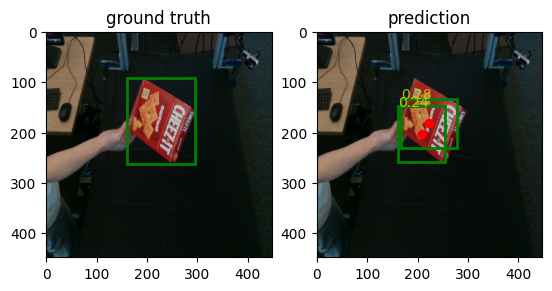

image 12/100, 2 objects detected


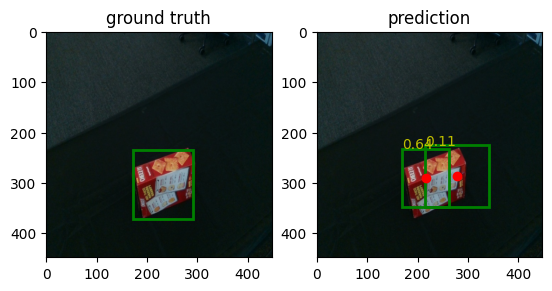

image 13/100, 1 objects detected


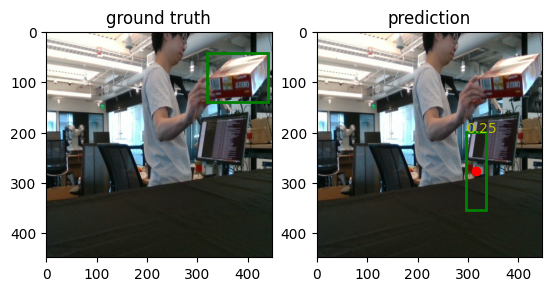

image 14/100, 1 objects detected


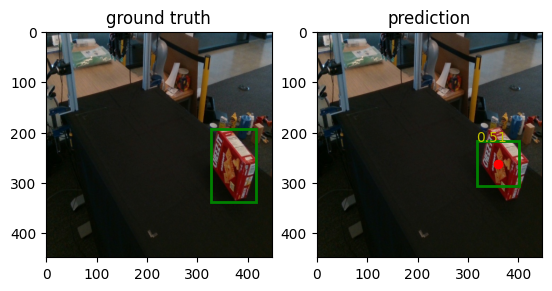

image 15/100, 1 objects detected


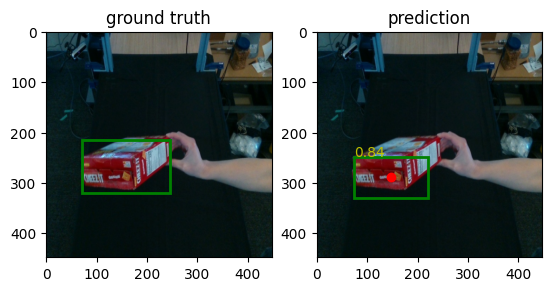

image 16/100, 1 objects detected


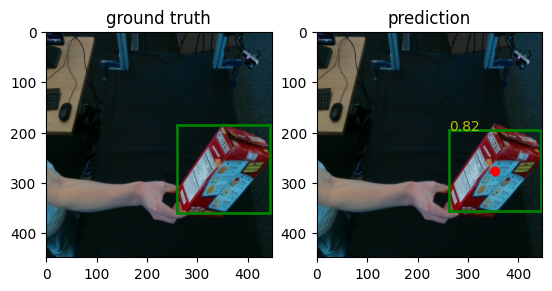

image 17/100, 1 objects detected


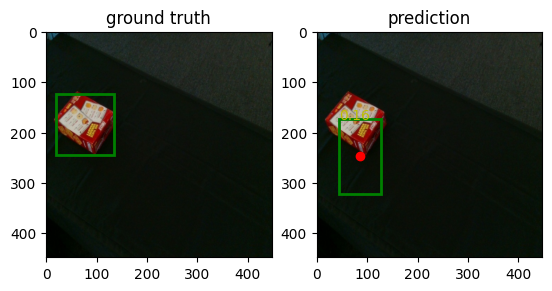

image 18/100, 3 objects detected


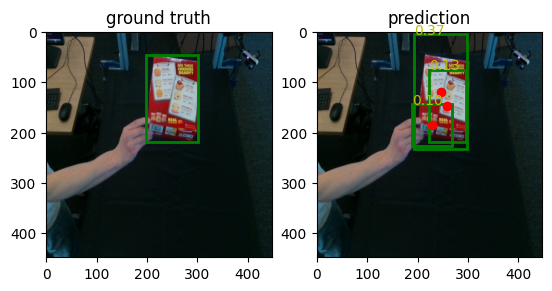

image 19/100, 1 objects detected


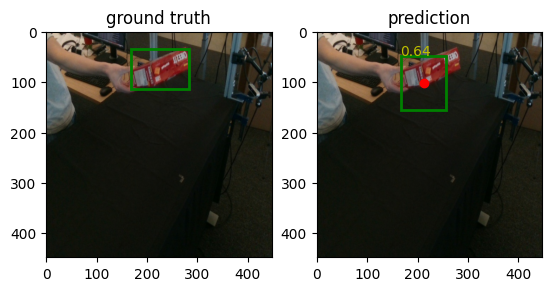

image 20/100, 1 objects detected


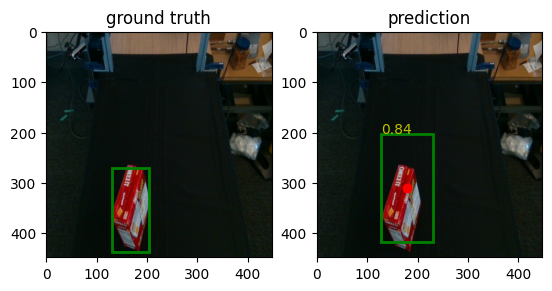

image 21/100, 1 objects detected


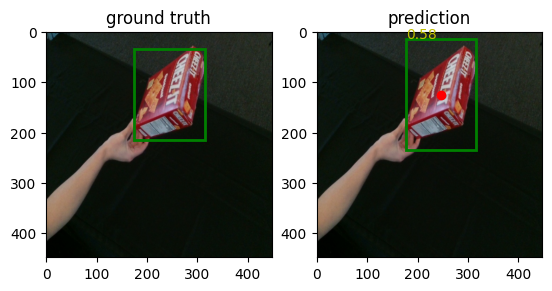

image 22/100, 0 objects detected


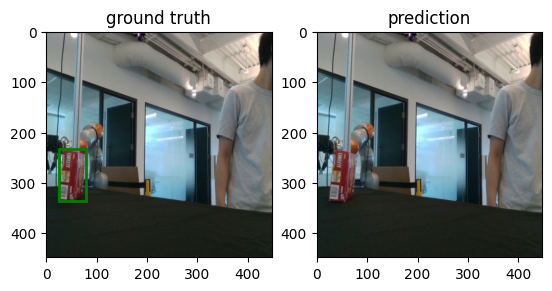

image 23/100, 1 objects detected


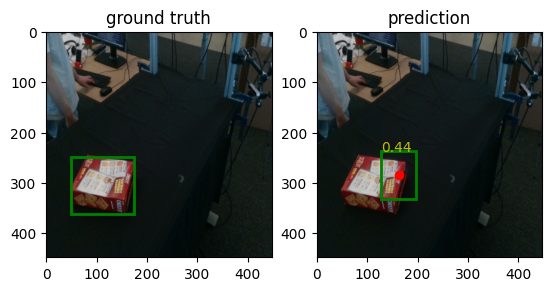

image 24/100, 1 objects detected


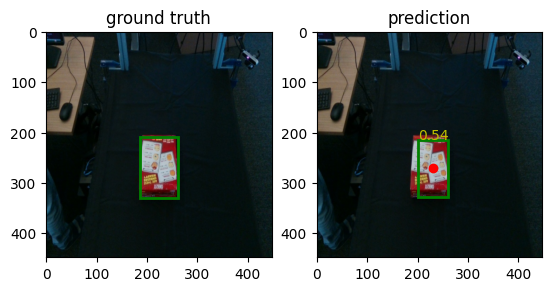

image 25/100, 2 objects detected


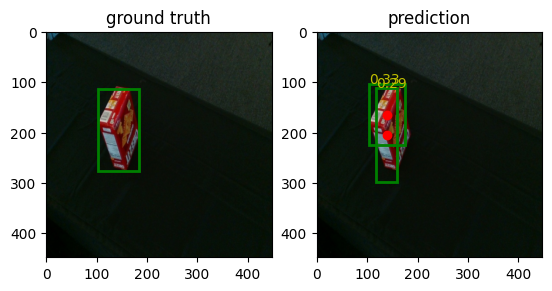

image 26/100, 2 objects detected


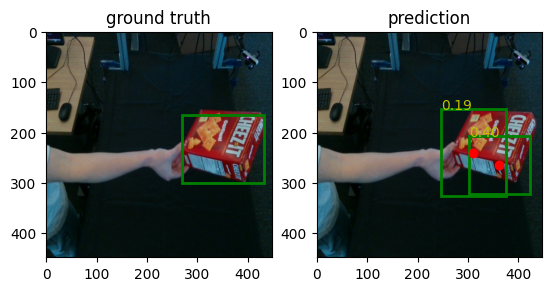

image 27/100, 1 objects detected


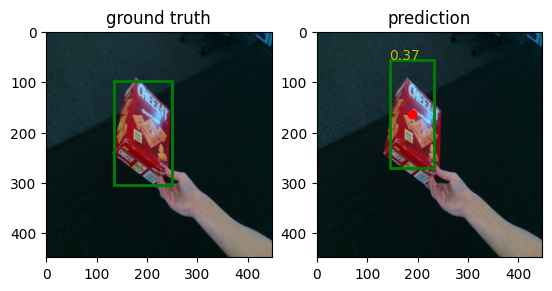

image 28/100, 2 objects detected


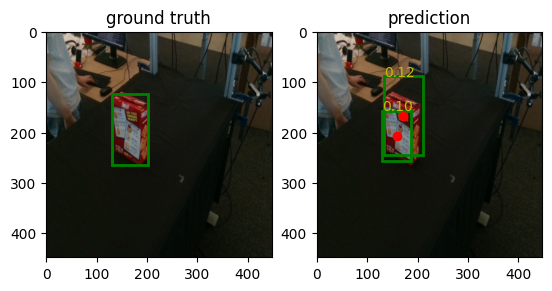

image 29/100, 1 objects detected


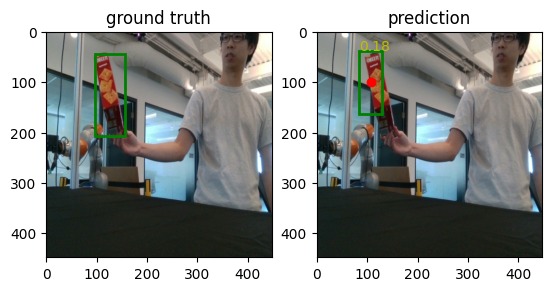

image 30/100, 1 objects detected


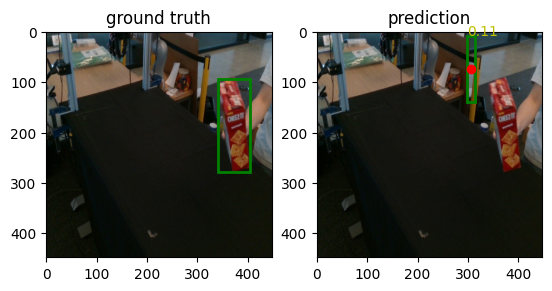

image 31/100, 1 objects detected


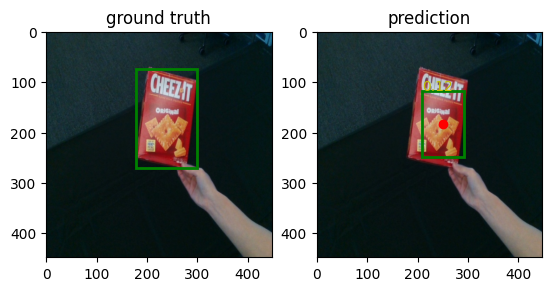

image 32/100, 1 objects detected


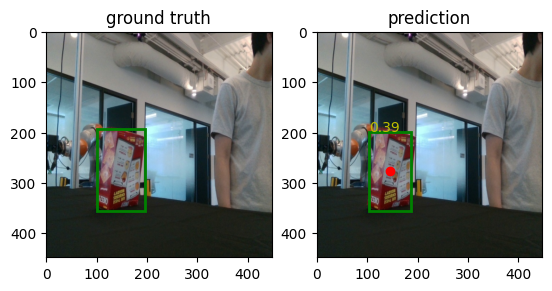

image 33/100, 2 objects detected


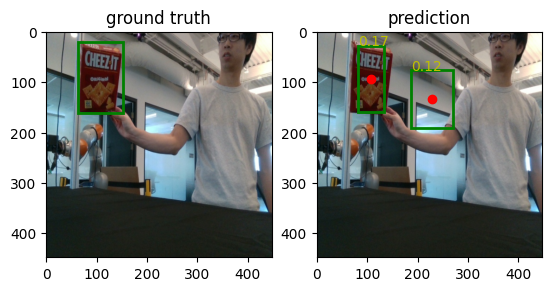

image 34/100, 1 objects detected


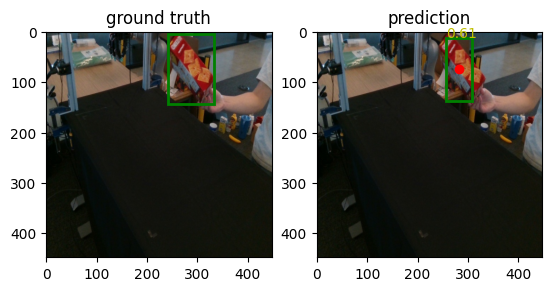

image 35/100, 1 objects detected


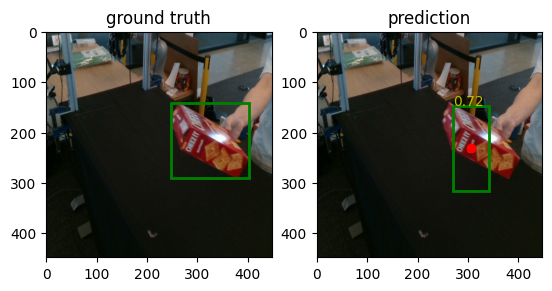

image 36/100, 1 objects detected


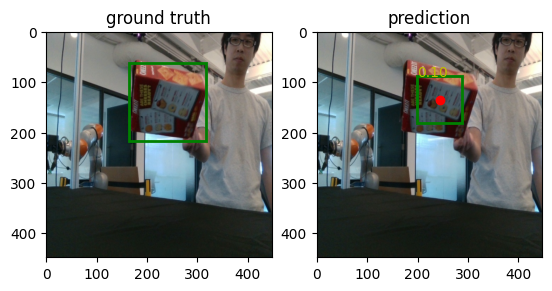

image 37/100, 0 objects detected


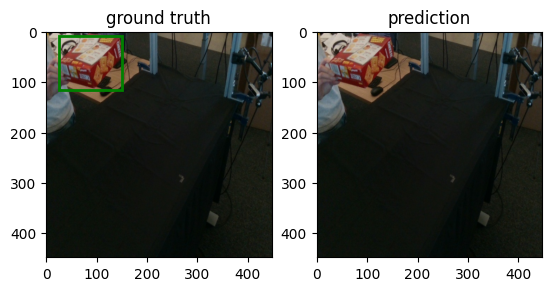

image 38/100, 1 objects detected


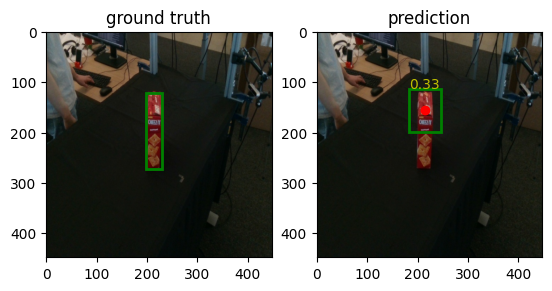

image 39/100, 1 objects detected


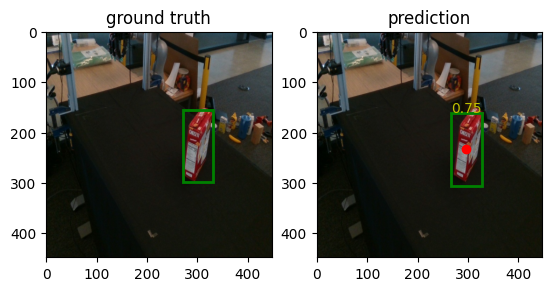

image 40/100, 1 objects detected


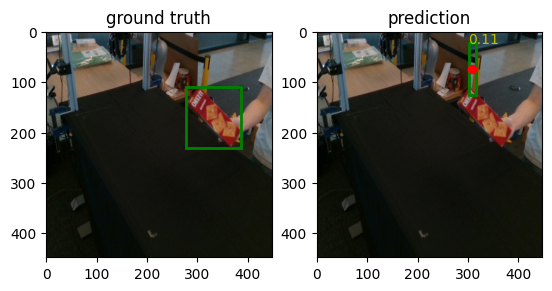

image 41/100, 1 objects detected


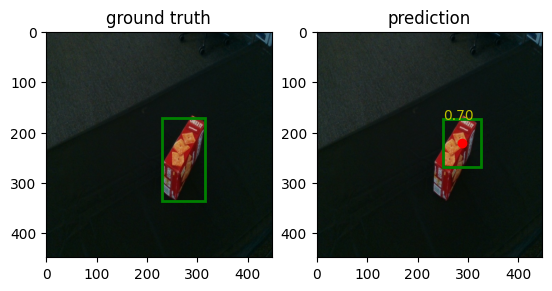

image 42/100, 2 objects detected


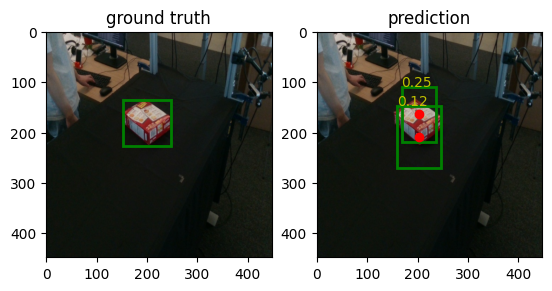

image 43/100, 2 objects detected


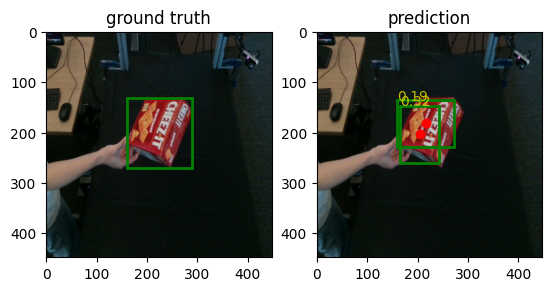

image 44/100, 1 objects detected


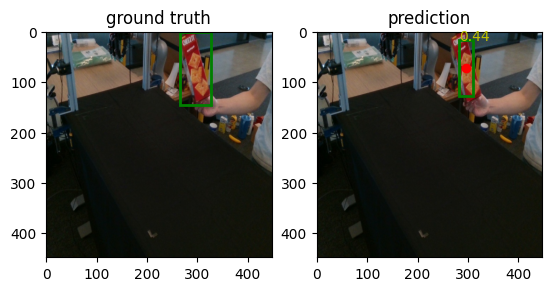

image 45/100, 1 objects detected


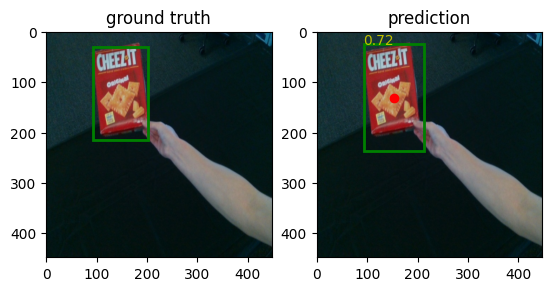

image 46/100, 1 objects detected


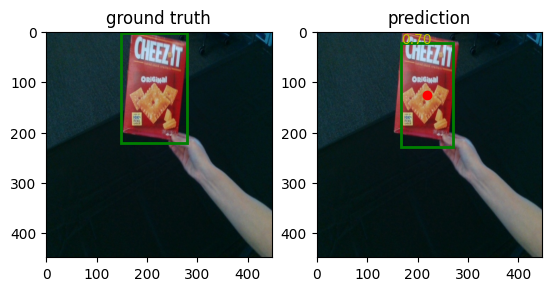

image 47/100, 1 objects detected


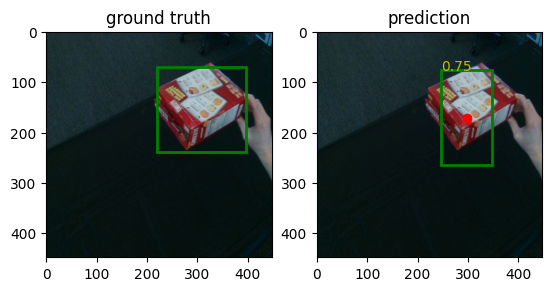

image 48/100, 1 objects detected


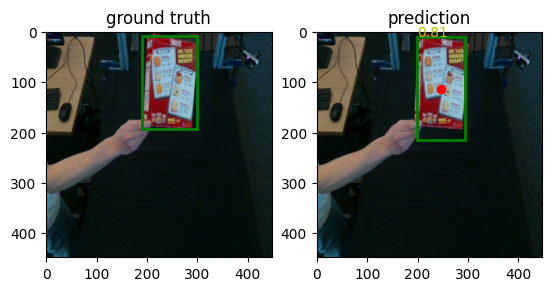

image 49/100, 0 objects detected


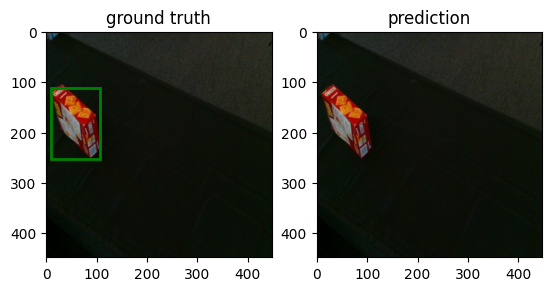

image 50/100, 1 objects detected


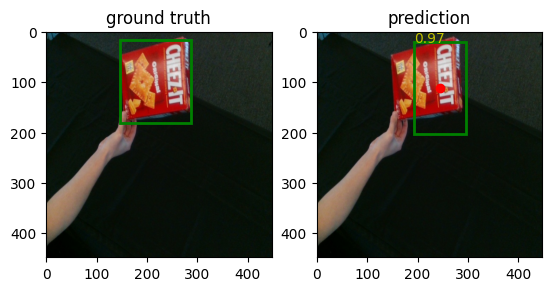

image 51/100, 0 objects detected


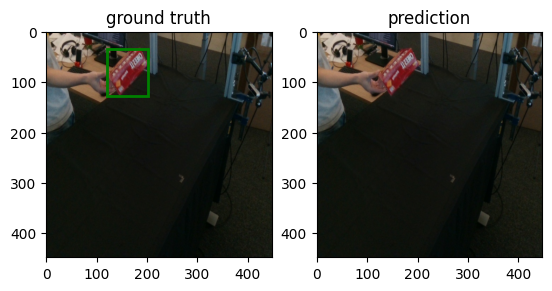

image 52/100, 2 objects detected


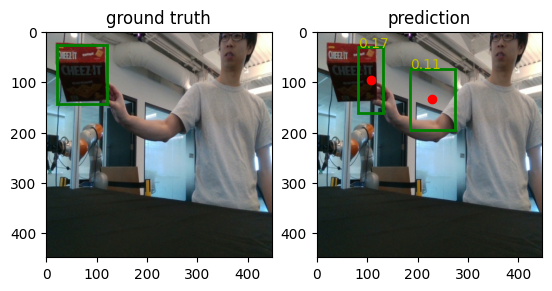

image 53/100, 2 objects detected


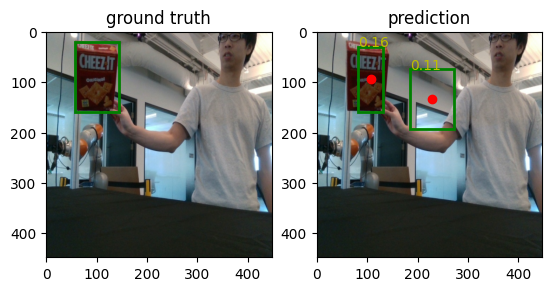

image 54/100, 1 objects detected


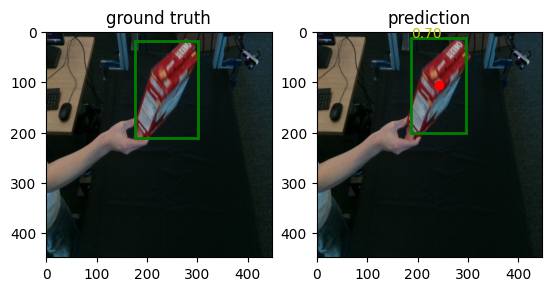

image 55/100, 1 objects detected


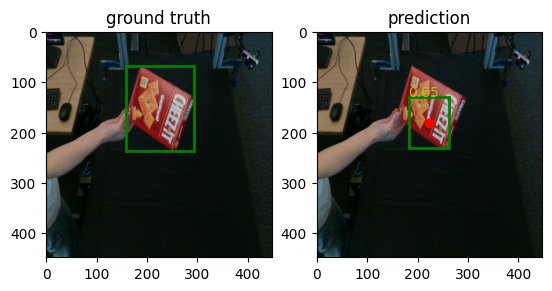

image 56/100, 1 objects detected


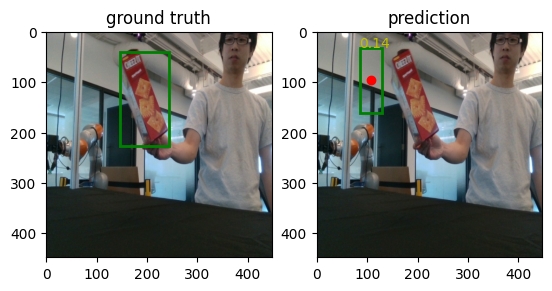

image 57/100, 1 objects detected


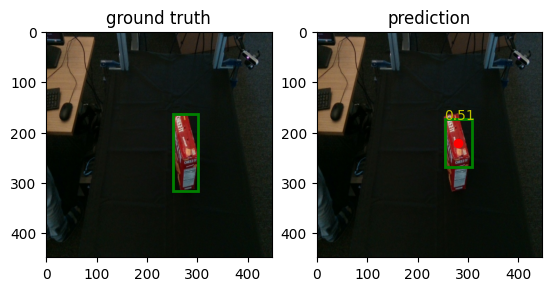

image 58/100, 1 objects detected


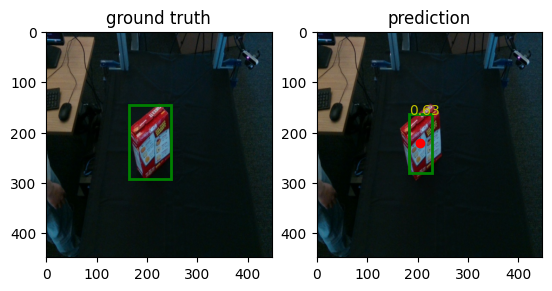

image 59/100, 2 objects detected


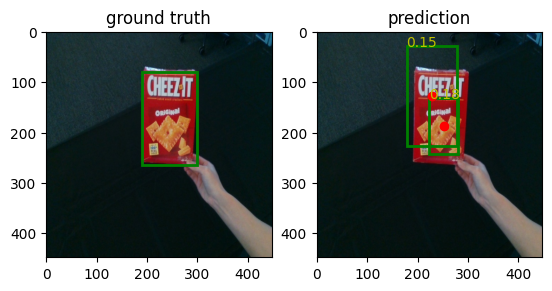

image 60/100, 2 objects detected


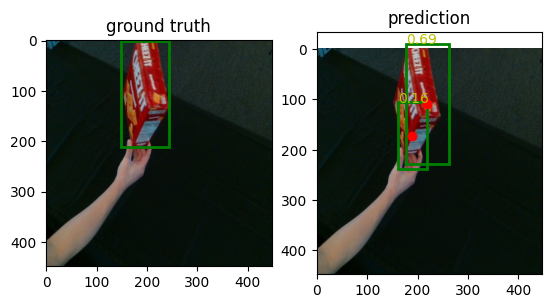

image 61/100, 2 objects detected


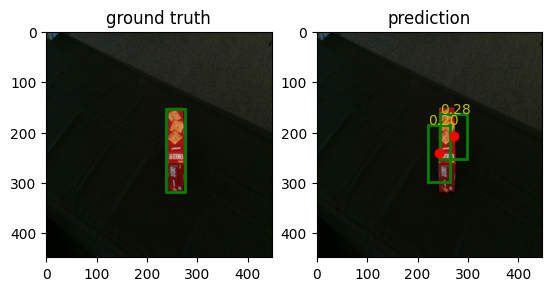

image 62/100, 0 objects detected


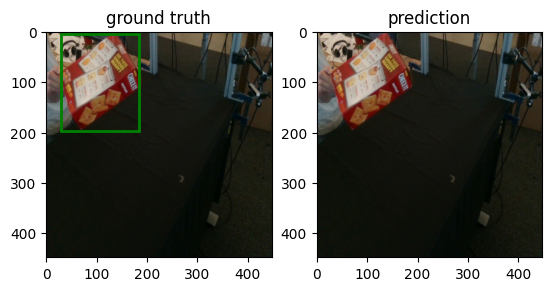

image 63/100, 2 objects detected


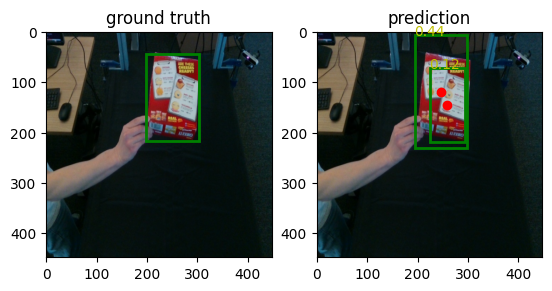

image 64/100, 0 objects detected


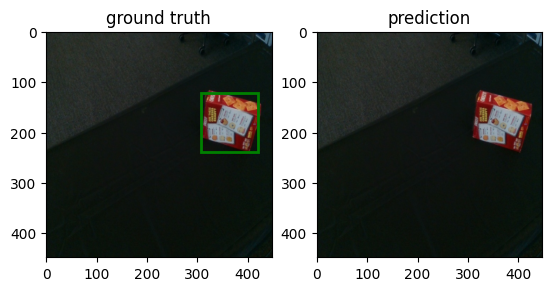

image 65/100, 2 objects detected


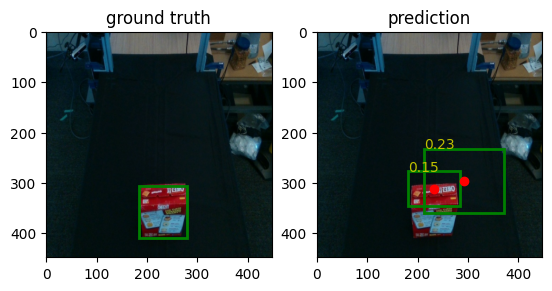

image 66/100, 1 objects detected


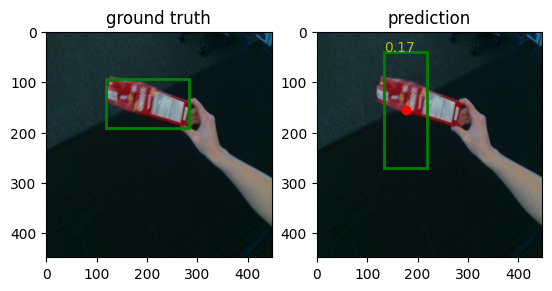

image 67/100, 1 objects detected


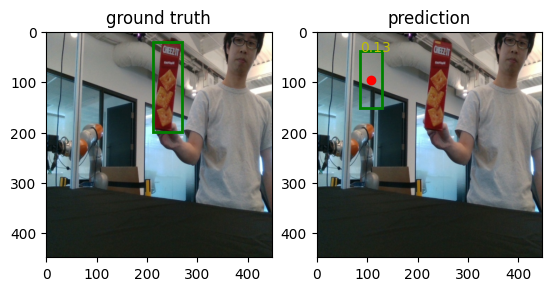

image 68/100, 1 objects detected


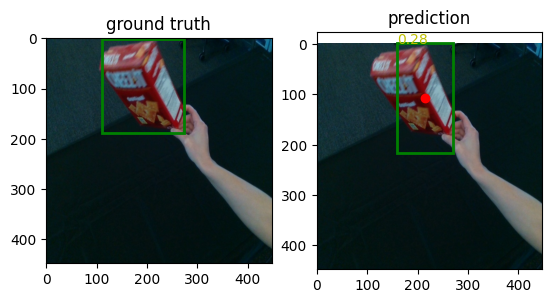

image 69/100, 2 objects detected


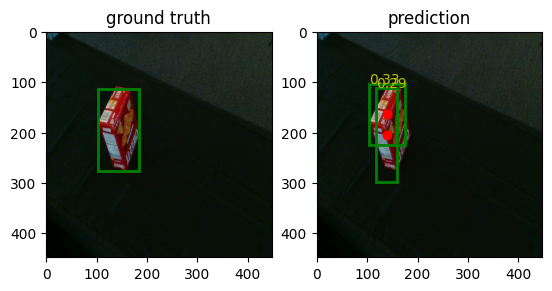

image 70/100, 2 objects detected


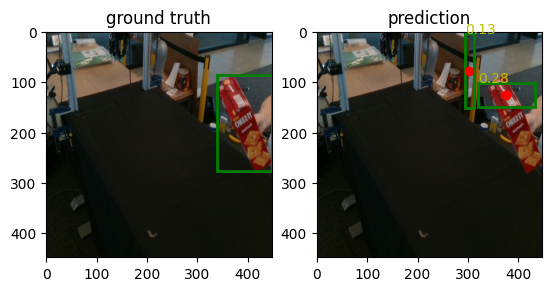

image 71/100, 1 objects detected


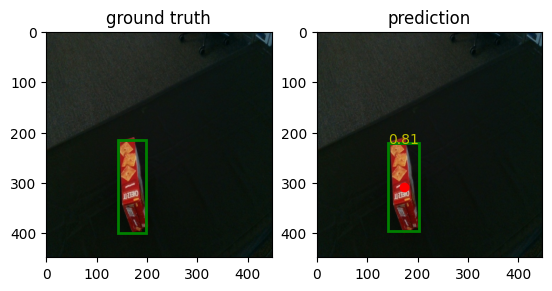

image 72/100, 1 objects detected


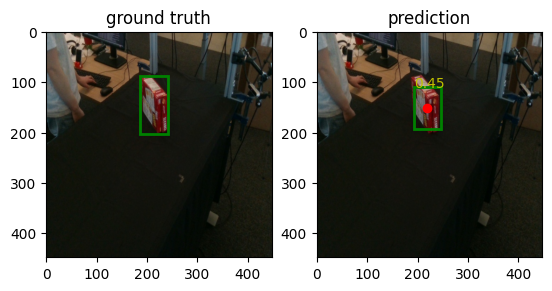

image 73/100, 1 objects detected


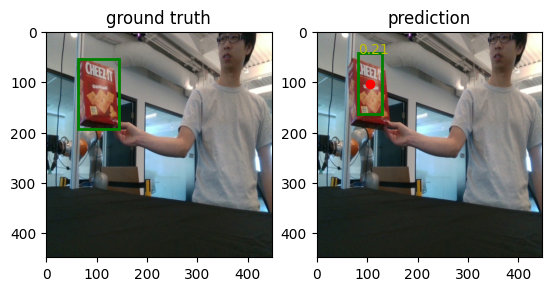

image 74/100, 1 objects detected


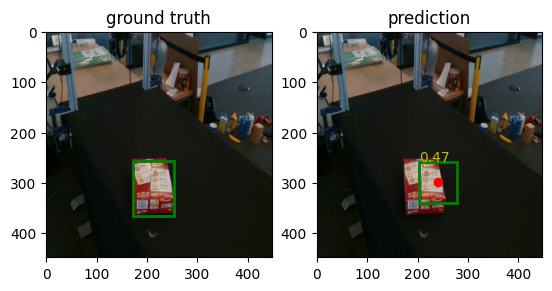

image 75/100, 2 objects detected


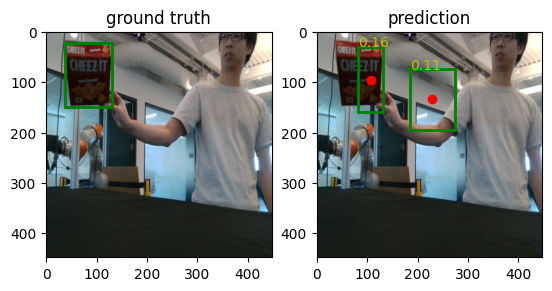

image 76/100, 2 objects detected


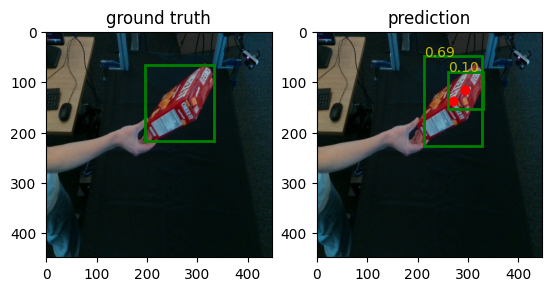

image 77/100, 2 objects detected


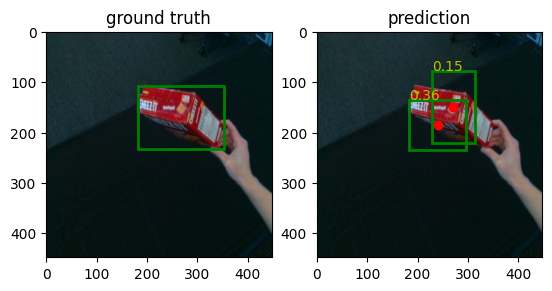

image 78/100, 1 objects detected


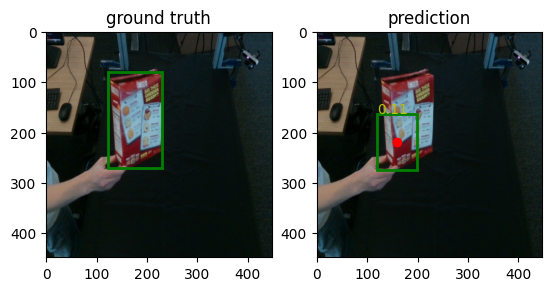

image 79/100, 1 objects detected


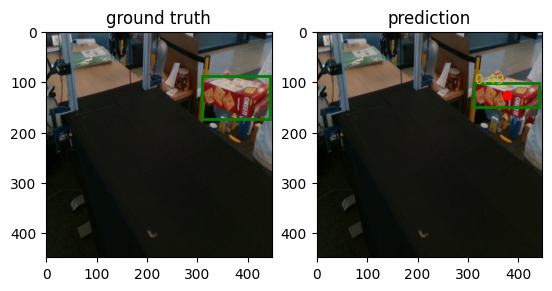

image 80/100, 1 objects detected


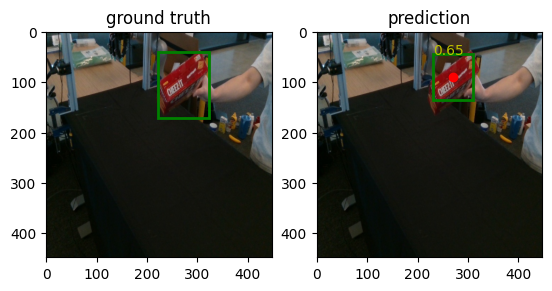

image 81/100, 1 objects detected


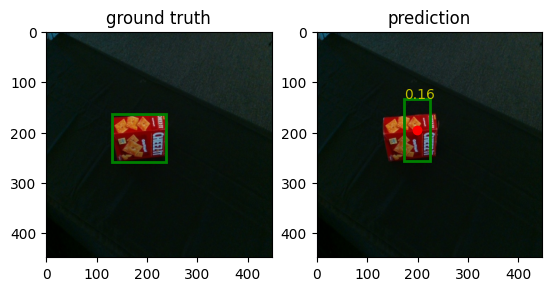

image 82/100, 2 objects detected


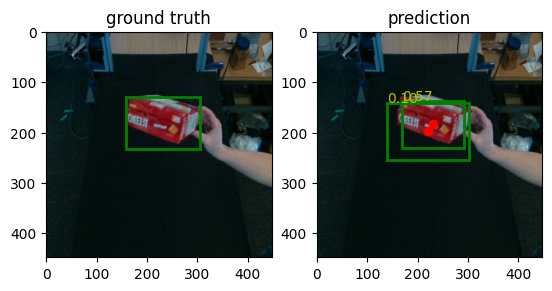

image 83/100, 1 objects detected


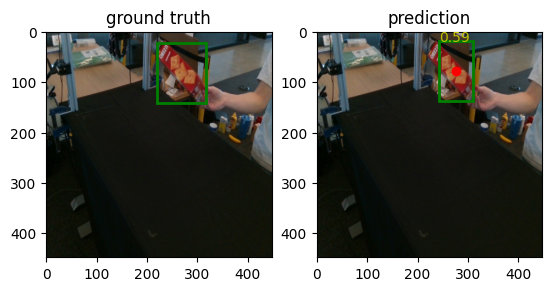

image 84/100, 1 objects detected


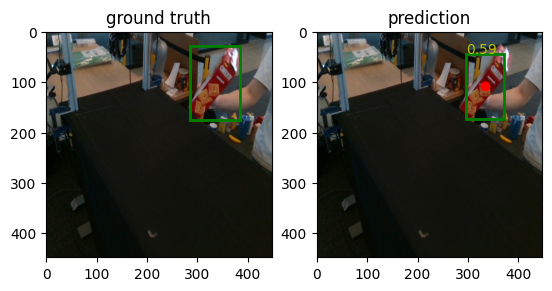

image 85/100, 2 objects detected


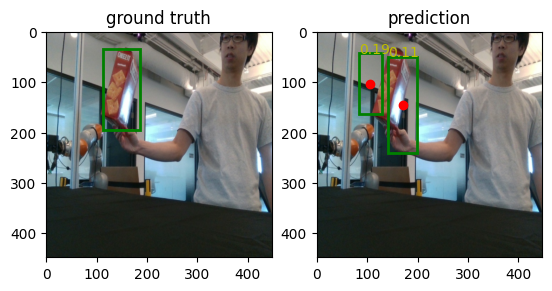

image 86/100, 1 objects detected


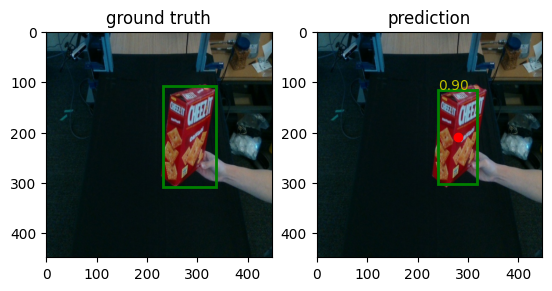

image 87/100, 1 objects detected


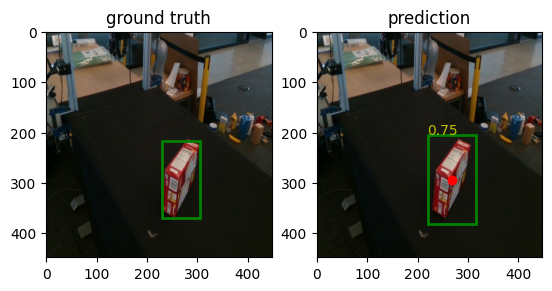

image 88/100, 1 objects detected


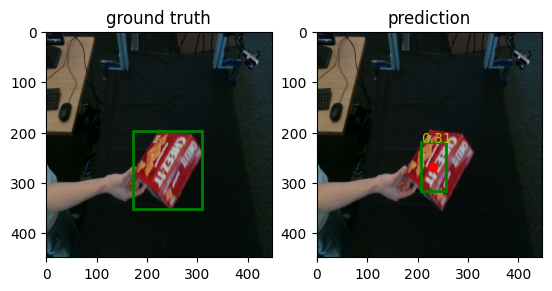

image 89/100, 2 objects detected


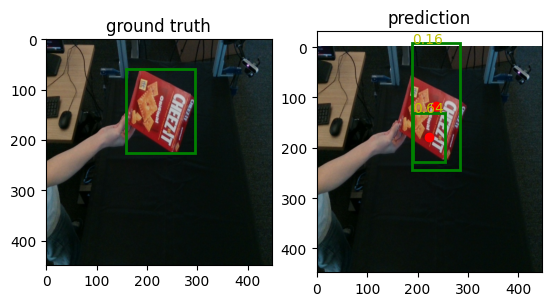

image 90/100, 2 objects detected


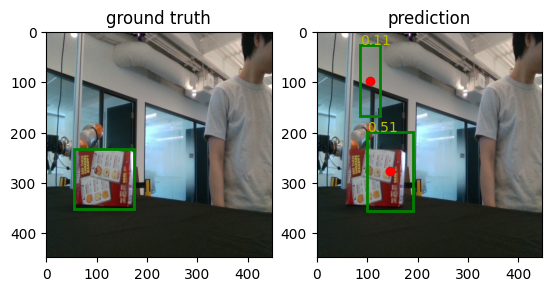

image 91/100, 1 objects detected


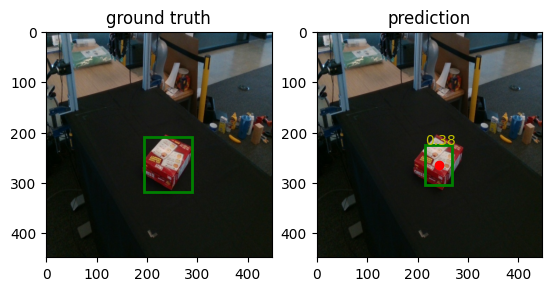

image 92/100, 0 objects detected


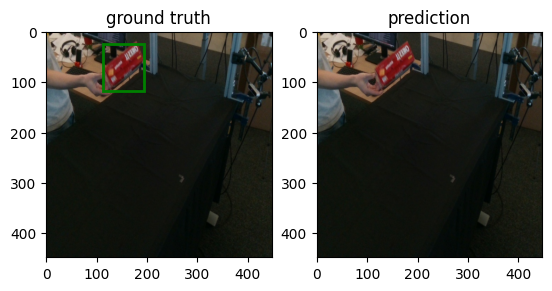

image 93/100, 2 objects detected


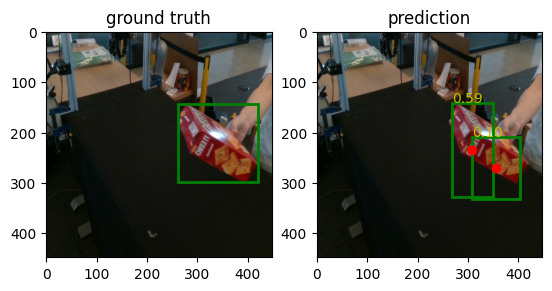

image 94/100, 2 objects detected


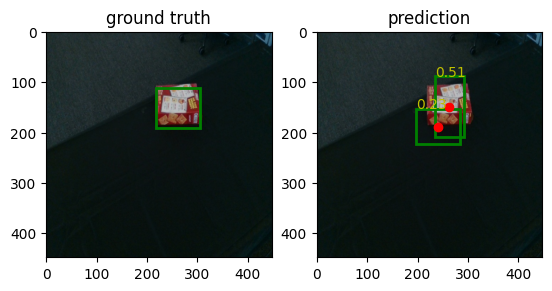

image 95/100, 2 objects detected


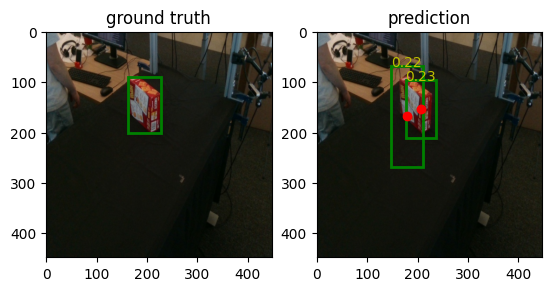

image 96/100, 2 objects detected


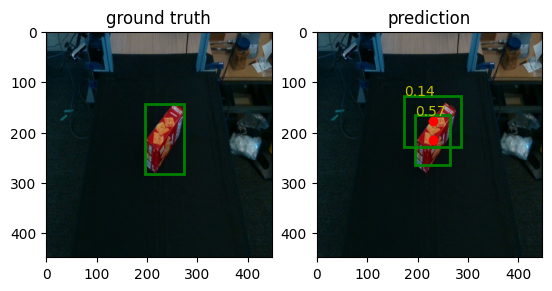

image 97/100, 2 objects detected


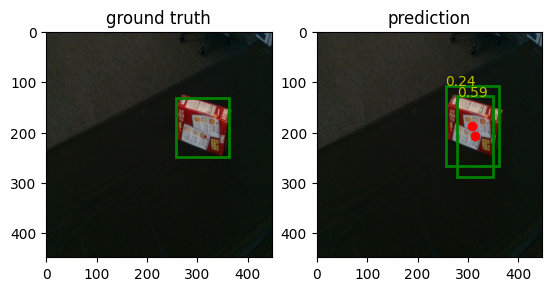

image 98/100, 1 objects detected


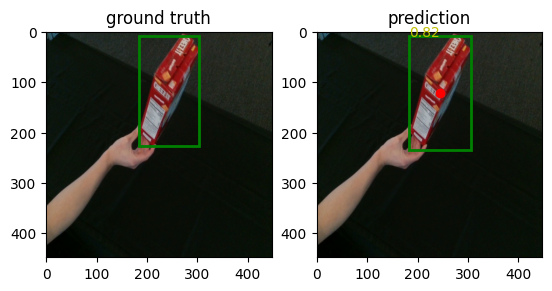

image 99/100, 1 objects detected


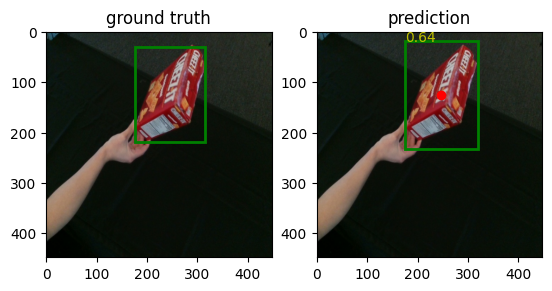

image 100/100, 1 objects detected


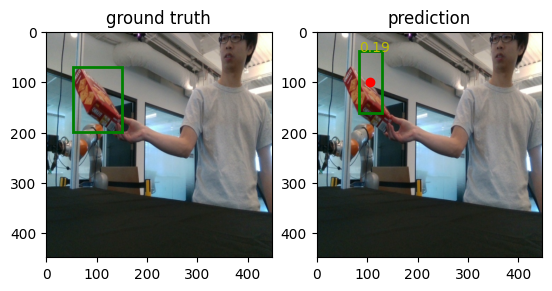

Detection AP 0.3695796288011805


<Figure size 600x400 with 0 Axes>

In [15]:
# from the network prediction, extract the bounding boxes with confidences larger than threshold
# pred_box: (batch_size, num_boxes * 5 + num_classes, 7, 7), predicted bounding boxes from the network (see the forward() function)
def extract_detections(pred_box, threshold, num_boxes):

    # extract boxes
    boxes_all = np.zeros((0, 5), dtype=np.float32)
    for i in range(num_boxes):
        confidence = pred_box[0, 5*i+4].detach().numpy()
        y, x = np.where(confidence > threshold)
        boxes = pred_box[0, 5*i:5*i+5, y, x].detach().numpy().transpose()
        boxes_all = np.concatenate((boxes_all, boxes), axis=0)

    # convert to (x1, y1, x2, y2)
    boxes = boxes_all.copy()
    boxes[:, 0] = boxes_all[:, 0] - boxes_all[:, 2] * 0.5
    boxes[:, 2] = boxes_all[:, 0] + boxes_all[:, 2] * 0.5
    boxes[:, 1] = boxes_all[:, 1] - boxes_all[:, 3] * 0.5
    boxes[:, 3] = boxes_all[:, 1] + boxes_all[:, 3] * 0.5
    return boxes


# visualize the detections
def visualize(image, gt, detections):

    im = image[0].permute(1, 2, 0).numpy()
    pixel_mean = np.array([[[102.9801, 115.9465, 122.7717]]], dtype=np.float32)

    # show ground truth
    fig = plt.figure()
    ax = fig.add_subplot(1, 2, 1)
    im = im * 255.0 + pixel_mean
    im = im.astype(np.uint8)
    plt.imshow(im[:, :, (2, 1, 0)])
    rect = patches.Rectangle((gt[0, 0], gt[0, 1]), gt[0, 2]-gt[0, 0], gt[0, 3]-gt[0, 1], linewidth=2, edgecolor='g', facecolor="none")
    ax.add_patch(rect)
    plt.title('ground truth')

    # show detection
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(im[:, :, (2, 1, 0)])
    plt.title('prediction')
    for i in range(detections.shape[0]):
        x1 = detections[i, 0]
        x2 = detections[i, 2]
        y1 = detections[i, 1]
        y2 = detections[i, 3]
        score = detections[i, 4]
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='g', facecolor="none")
        ax.add_patch(rect)
        plt.plot((x1+x2)/2, (y1+y2)/2, 'ro')
        ax.text(x1, y1, '%.2f' % score, color = 'y')
    plt.show()


# main function for testing
if __name__ == '__main__':

    # dataset
    dataset = CrackerBox('val')
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True, num_workers=0)
    epoch_size = len(data_loader)

    # network
    num_classes = 1
    num_boxes = 2
    network = YOLO(num_boxes, num_classes)
    image_size = network.image_size
    grid_size = network.grid_size

    # load checkpoint
    output_dir = 'checkpoints'
    filename = 'yolo_final.checkpoint.pth'
    filename = os.path.join(output_dir, filename)
    network.load_state_dict(torch.load(filename))
    network.eval()

    # detection threshold
    threshold = 0.1

    # main test loop
    results_gt = []
    results_pred = []
    for i, sample in enumerate(data_loader):

        image = sample['image']
        gt_box = sample['gt_box']
        gt_mask = sample['gt_mask']

        # forward pass
        output, pred_box = network(image)

        # convert gt box
        gt_box = sample['gt_box'][0].numpy()
        gt_mask = sample['gt_mask'][0].numpy()
        y, x = np.where(gt_mask == 1)
        cx = gt_box[0, y, x] * dataset.yolo_grid_size + x * dataset.yolo_grid_size
        cy = gt_box[1, y, x] * dataset.yolo_grid_size + y * dataset.yolo_grid_size
        w = gt_box[2, y, x] * dataset.yolo_image_size
        h = gt_box[3, y, x] * dataset.yolo_image_size
        x1 = cx - w * 0.5
        x2 = cx + w * 0.5
        y1 = cy - h * 0.5
        y2 = cy + h * 0.5
        gt = np.array([x1, y1, x2, y2]).reshape((1, 4))
        results_gt.append(gt)

        # extract predictions
        detections = extract_detections(pred_box, threshold, num_boxes)
        results_pred.append(detections)
        print('image %d/%d, %d objects detected' % (i+1, epoch_size, detections.shape[0]))

        # visualization, uncomment the follow line to see the detection results
        visualize(image, gt, detections)

    # evaluation
    rec, prec, ap = voc_eval(results_gt, results_pred)
    print('Detection AP', ap)

    # save the PR curve
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    plt.plot(rec, prec)
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.title('AP: %.2f' % ap)
    plt.gcf().set_size_inches(6, 4)
    plt.savefig('test_ap.png', bbox_inches='tight')
    plt.clf()
